<a href="https://colab.research.google.com/github/roberto-takada/PDIE8-notebooks/blob/main/FundamentosDeImagemParte2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# R. Takada

## Fundamentos de Imagem

#### Importando bibliotecas

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageFilter
from scipy import ndimage
from scipy.ndimage import uniform_filter, median_filter
import cv2
import os
# Tem um link no arquivo .py para o arquivo no collab
# Criar uma pasta no google collab chamada images e colocar as imagens lá dentro
imageNames = os.listdir('./images')
images = [Image.open('./images/' + img).convert('L') for img in imageNames]

#### Função para plotar ambas as imagens

In [ ]:
def plota(imagem1, imagem2, texto):
    plt.figure(figsize=(10, 10))

    plt1 = plt.subplot(1, 2, 1)
    plt1.imshow(imagem1, cmap='gray')
    plt1.set_title('Original')

    plt2 = plt.subplot(1, 2, 2)
    plt2.imshow(imagem2, cmap='gray')
    plt2.set_title(texto)


### 3 - Transformações Geométricas

#### Escala usando numpy

In [ ]:
def escala_numpy(imagem, escala):
  imagem_array = np.array(imagem)
  tam_imagem = imagem_array.shape

  novas_linhas = int(tam_imagem[0] * escala)
  novas_colunas = int(tam_imagem[1] * escala)

  image_nd = np.zeros((novas_linhas, novas_colunas), dtype=np.uint8)

  for x in range(novas_linhas):
      for y in range(novas_colunas):
          # get the nearest neighbor
          nearest_x = int(x / escala)
          nearest_y = int(y / escala)

          image_nd[x, y] = imagem_array[nearest_x, nearest_y]
  plota(imagem_array, image_nd, "Escala por Numpy")

#### Escala usando Pillow

In [ ]:
def escala_pillow(imagem, escala):
    imagem_antiga = np.array(imagem)
    imagem_array = Image.fromarray(imagem_antiga)
    imagem_array = imagem_array.resize((int(imagem_array.width * escala), int(imagem_array.height * escala)), Image.NEAREST)
    imagem_array_np = np.array(imagem_array)
    plota(imagem_antiga, imagem_array_np, "Escala por Pillow")

#### Escala usando OpenCV2

In [ ]:
def escala_cv2(imagem, escala):
    imagem_array = np.array(imagem)
    imagem_resultado = cv2.resize(imagem_array, (int(imagem_array.shape[1] * escala), int(imagem_array.shape[0] * escala)), interpolation=cv2.INTER_NEAREST)
    plota(imagem_array, imagem_resultado, "Escala por OpenCV2")

#### Escala usando Scipy

In [ ]:
def escala_scipy(imagem, escala):
    imagem_array = np.array(imagem)
    imagem_resultado = ndimage.zoom(imagem, escala, order=0)
    plota(imagem_array, imagem_resultado, "Escala por Scipy")

#### Resultado

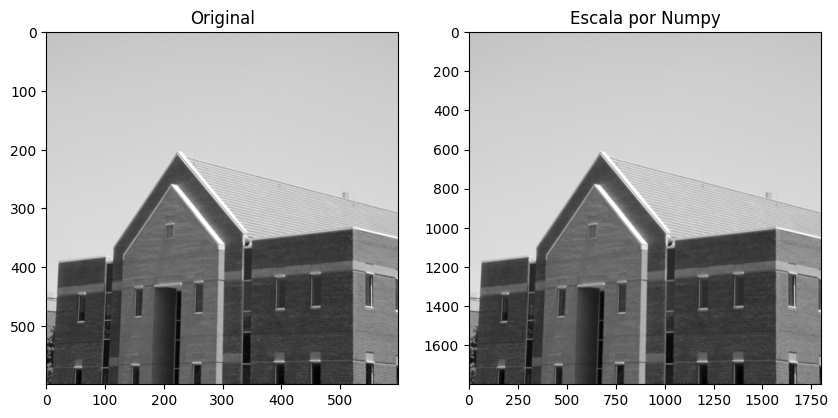

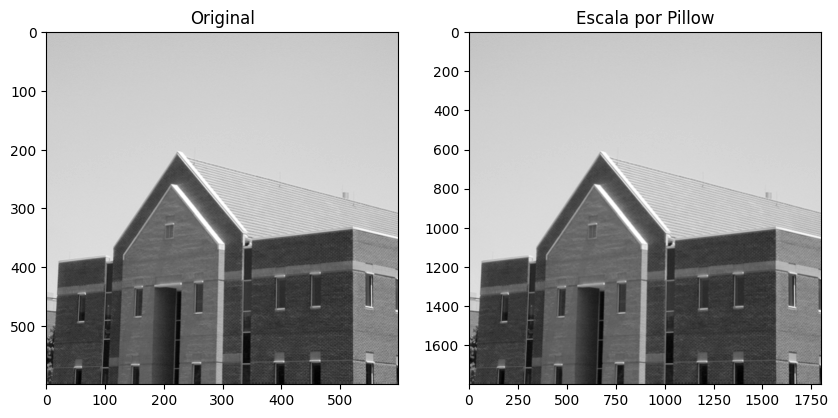

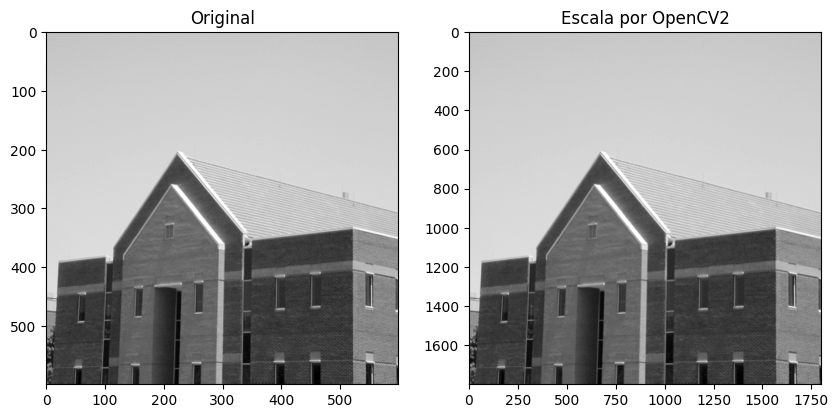

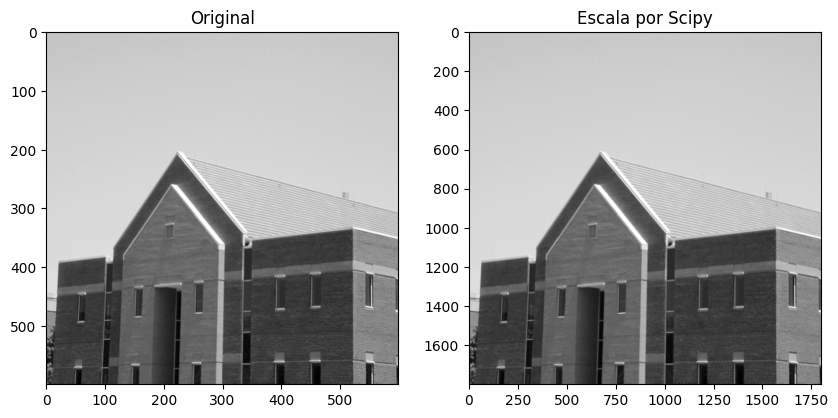

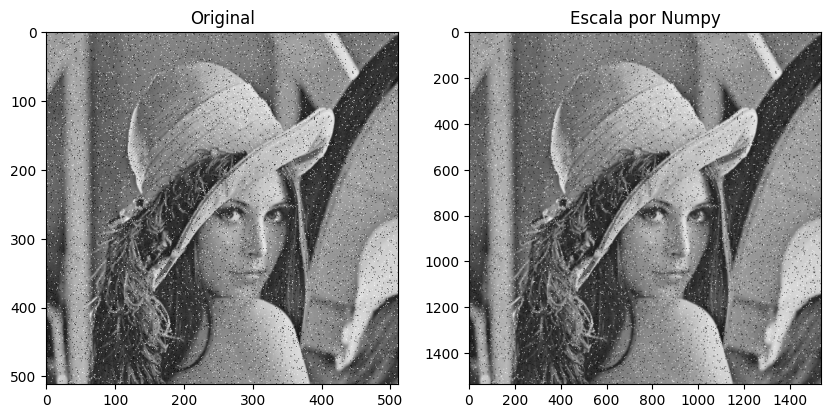

...

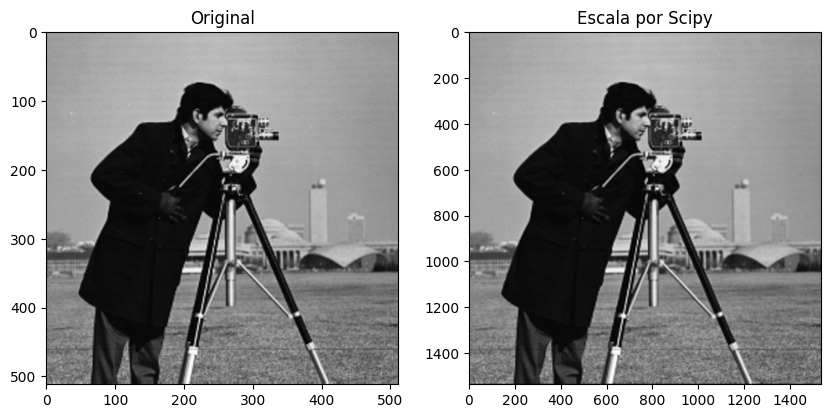

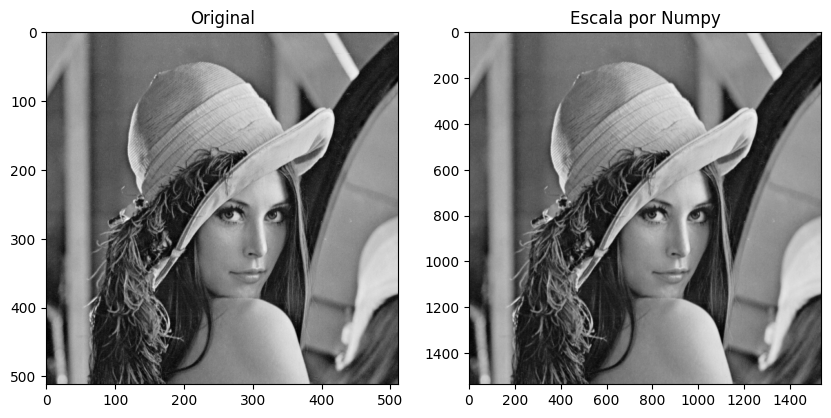

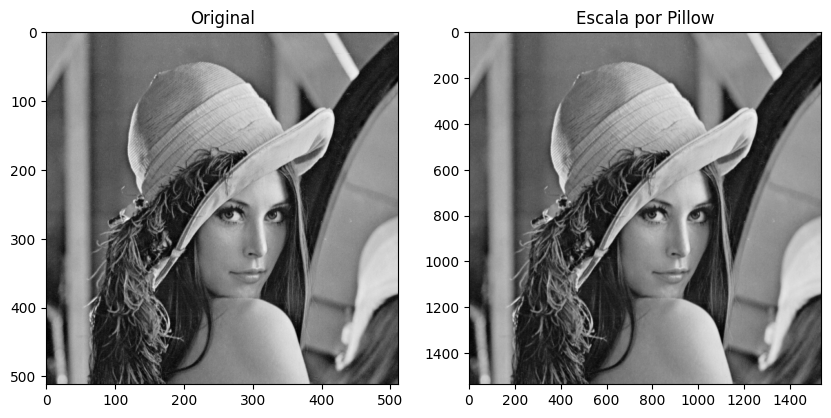

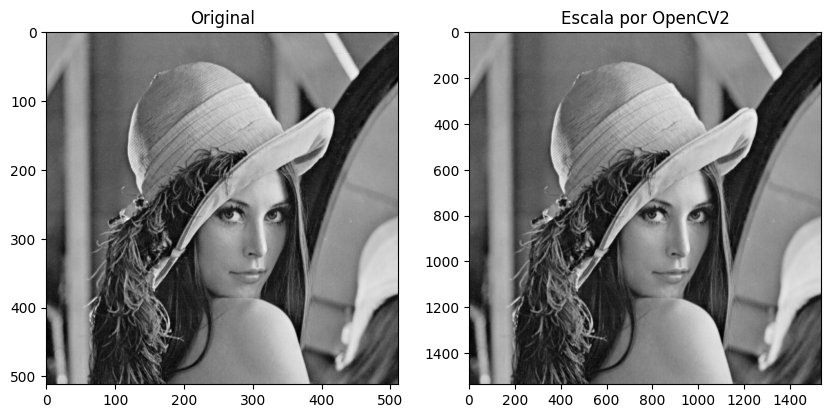

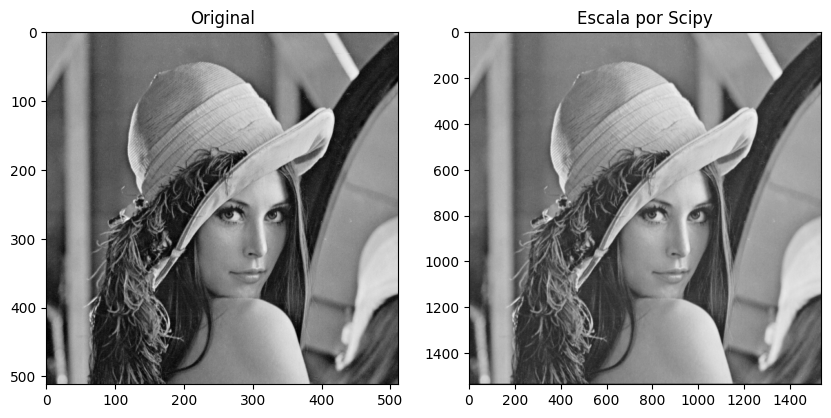

In [ ]:
for index in range(len(images)):
  imagem = images[index]
  escala = 3
  escala_numpy(imagem, escala)
  escala_pillow(imagem, escala)
  escala_cv2(imagem, escala)
  escala_scipy(imagem, escala)

#### Rotação com Numpy

In [ ]:
def rotacao_numpy(imagem, angulo):
  imagem_array = np.array(imagem)
  imagem_resultado = ndimage.rotate(imagem_array, angulo, reshape = False, order = 0)
  plota(imagem_array, imagem_resultado, "Rotação por Numpy")

#### Rotação por Pillow

In [ ]:
def rotacao_pillow(imagem, angulo):
  imagem_array = np.array(imagem)
  imagem_resultado = Image.fromarray(imagem_array)
  imagem_resultado = imagem_resultado.rotate(angulo, resample=Image.NEAREST)
  plota(imagem_array, imagem_resultado, "Rotação por Pillow")

#### Rotação com OpenCV2

In [ ]:
def rotacao_cv2(imagem, angulo):
    imagem_array = np.array(imagem)
    tam_imagem = imagem_array.shape
    M = cv2.getRotationMatrix2D((tam_imagem[1] / 2, tam_imagem[0] / 2), angulo, 1)
    imagem_resultado = cv2.warpAffine(imagem_array, M, (tam_imagem[1], tam_imagem[0]), borderMode=cv2.BORDER_CONSTANT, borderValue=0)
    plota(imagem_array, imagem_resultado, "Rotação por OpenCV2")

#### Rotação com Scipy

In [ ]:
def rotacao_scipy(imagem, angulo):
  imagem_array = np.array(imagem)
  imagem_resultado = ndimage.rotate(imagem_array, angulo, reshape=False, order=0)
  plota(imagem_array, imagem_resultado, "Rotação por Scipy")

#### Resultado

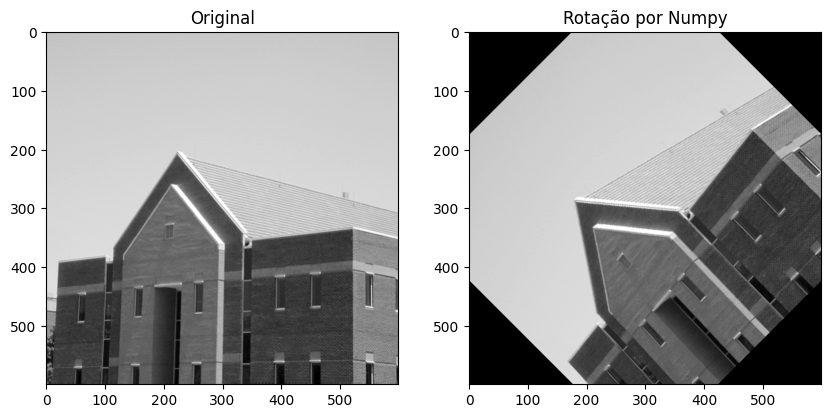

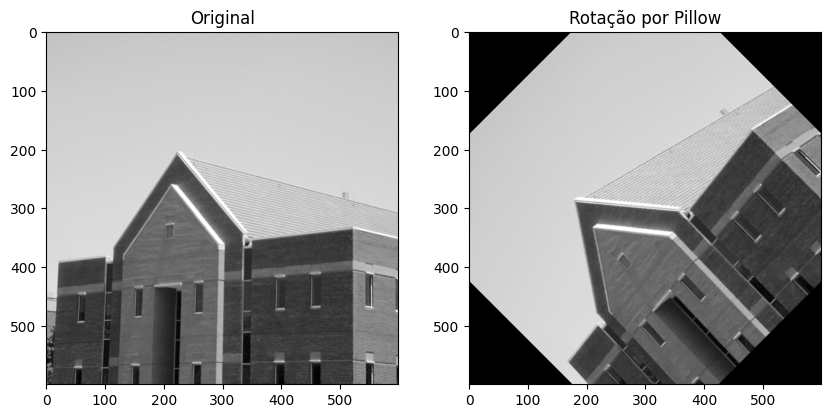

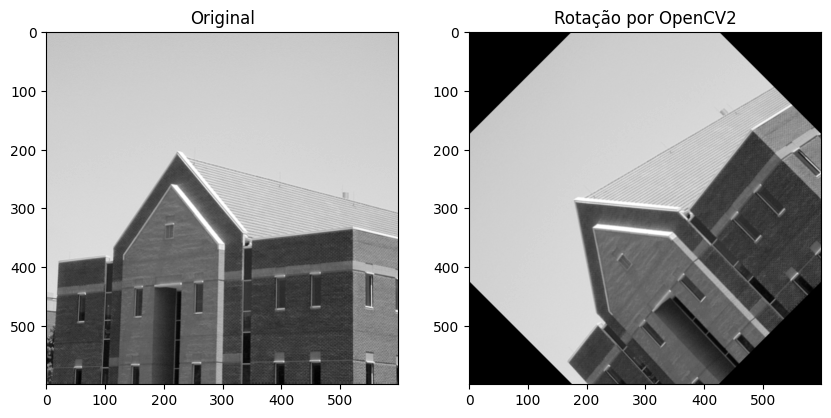

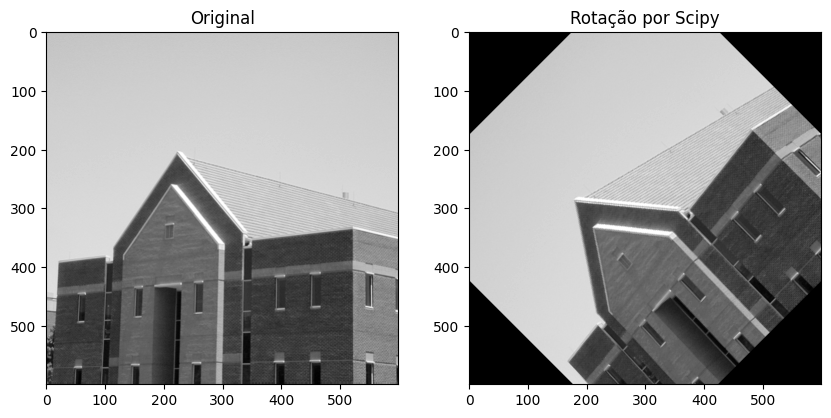

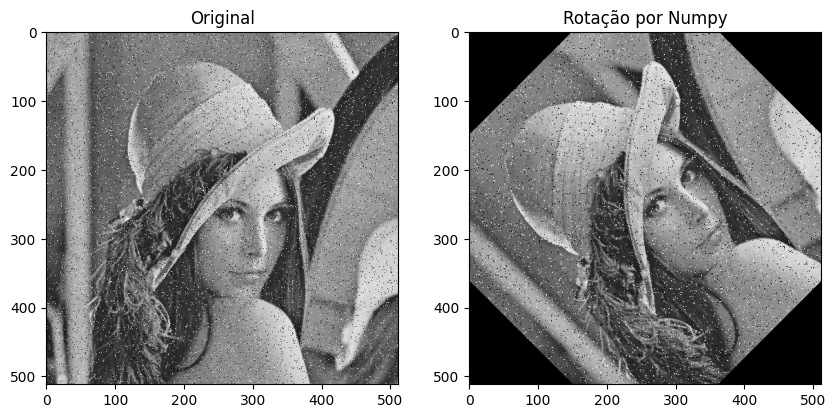

...

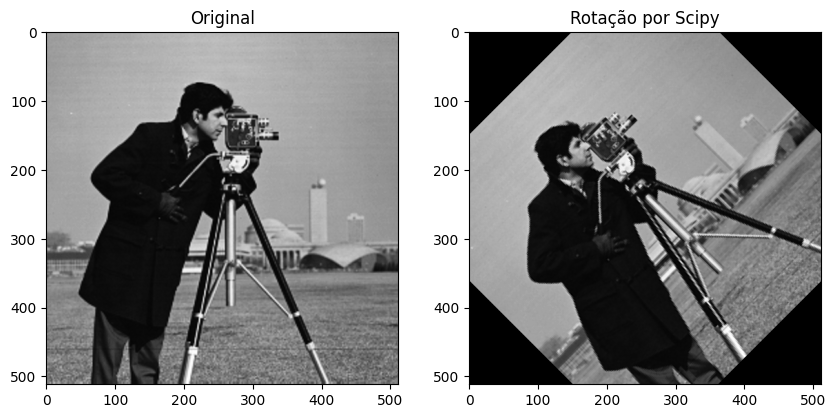

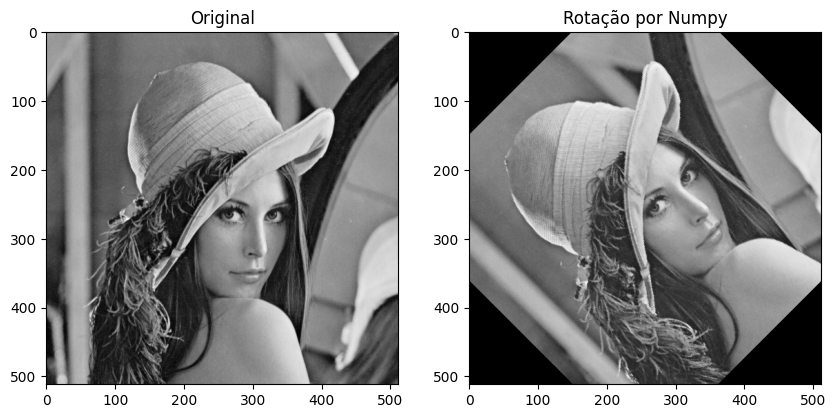

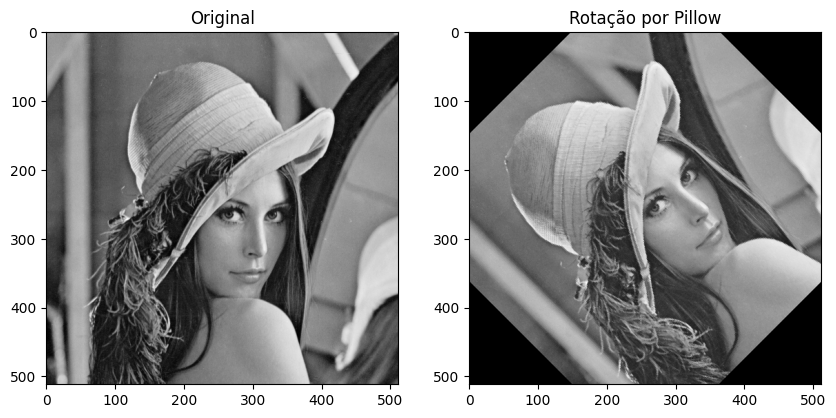

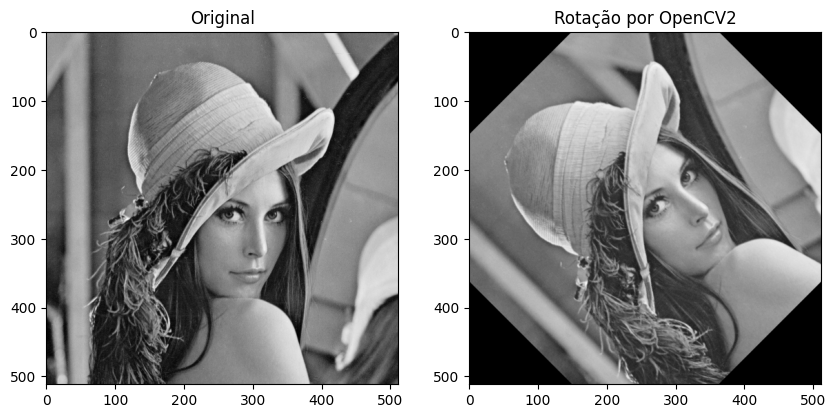

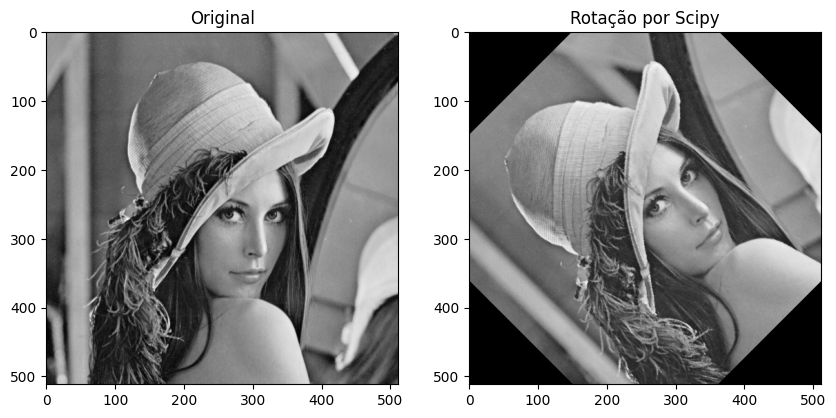

In [ ]:
for index in range(len(images)):
  imagem = images[index]
  angulo = 45
  rotacao_numpy(imagem, angulo)
  rotacao_pillow(imagem, angulo)
  rotacao_cv2(imagem, angulo)
  rotacao_scipy(imagem, angulo)

#### Translação em X e Y usando Numpy


In [ ]:
def translacao_numpy(imagem, x, y):
  imagem_array = np.array(imagem)
  tam_imagem = imagem_array.shape

  imagem_translacao = np.zeros_like(imagem_array)

  x_comeco = max(0, x)
  x_fim = min(tam_imagem[1], tam_imagem[1] + x)
  y_comeco = max(0, y)
  y_fim = min(tam_imagem[0], tam_imagem[0] + y)

  x_original_comeco = max(0, -x)
  x_original_fim = min(tam_imagem[1], tam_imagem[1] - x)
  y_original_comeco = max(0, -y)
  y_original_fim = min(tam_imagem[0], tam_imagem[0] - y)

  imagem_translacao[y_comeco:y_fim, x_comeco:x_fim] = imagem_array[y_original_comeco:y_original_fim, x_original_comeco:x_original_fim]

  plota(imagem_array, imagem_translacao, "Translação usando numpy")

#### Translacao por Pillow

In [ ]:
def translacao_pillow(imagem, x, y):
  imagem_array = np.array(imagem)
  imagem_translacao = Image.fromarray(imagem_array)
  imagem_translacao = imagem_translacao.transform(imagem_translacao.size,Image.AFFINE,(1, 0, -x, 0, 1, -y),resample=Image.Resampling.NEAREST,fillcolor=(0))
  imagem_translacao_resultado = np.array(imagem_translacao)
  plota(imagem_array, imagem_translacao_resultado, "Translação usando Pillow")

#### Translacao por OpenCV2

In [ ]:
def translacao_opencv(imagem, x, y):
  imagem_array = np.array(imagem)
  tam_imagem = imagem_array.shape
  M = np.float32([[1, 0, x], [0, 1, y]])
  imagem_translacao = cv2.warpAffine(imagem_array, M, (tam_imagem[1], tam_imagem[0]), borderMode=cv2.BORDER_CONSTANT, borderValue=0)
  plota(imagem_array, imagem_translacao, "Translação usando scipy")

#### Translacao por Scipy

In [ ]:
def translacao_scipy(imagem, x, y):
    imagem_array = np.array(imagem)
    imagem_translacao = ndimage.shift(imagem, (x, y), order=0)
    plota(imagem_array, imagem_translacao, "Translação usando scipy")

#### Resultado

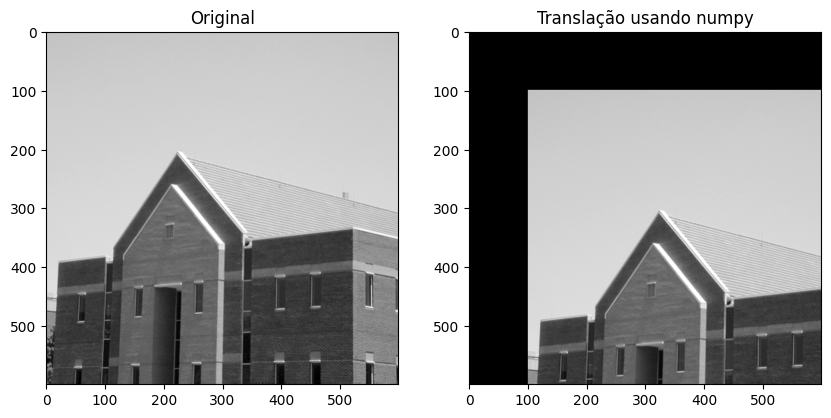

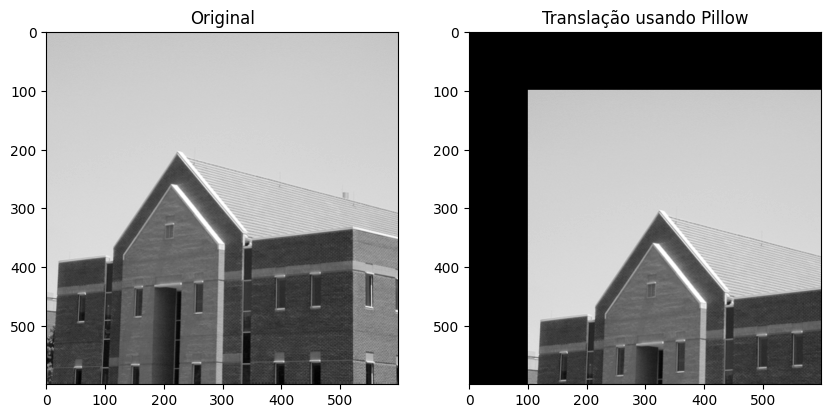

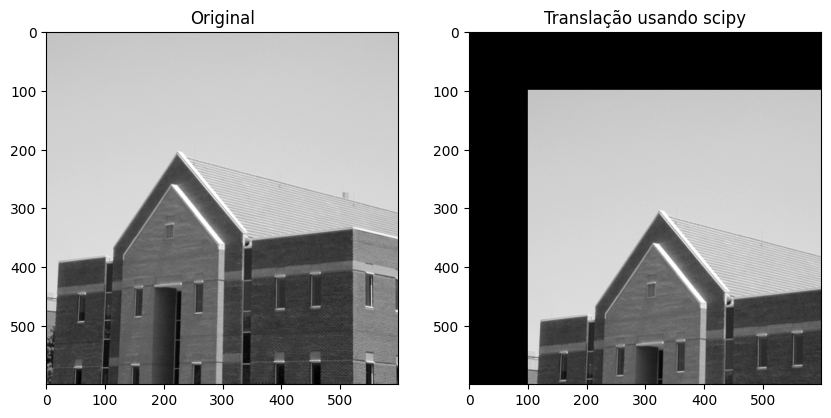

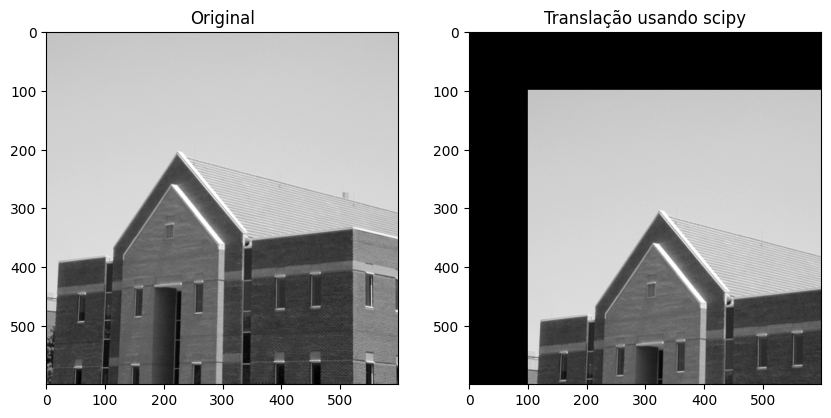

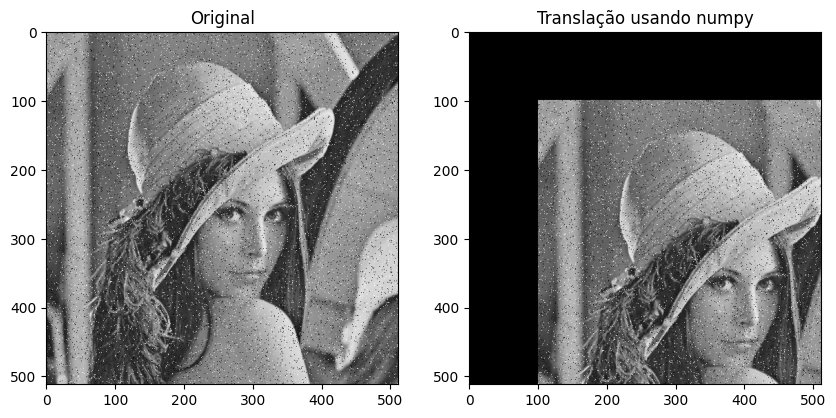

...

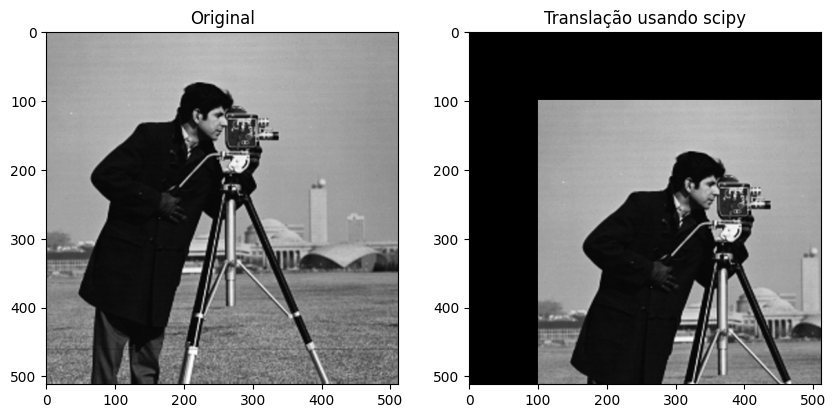

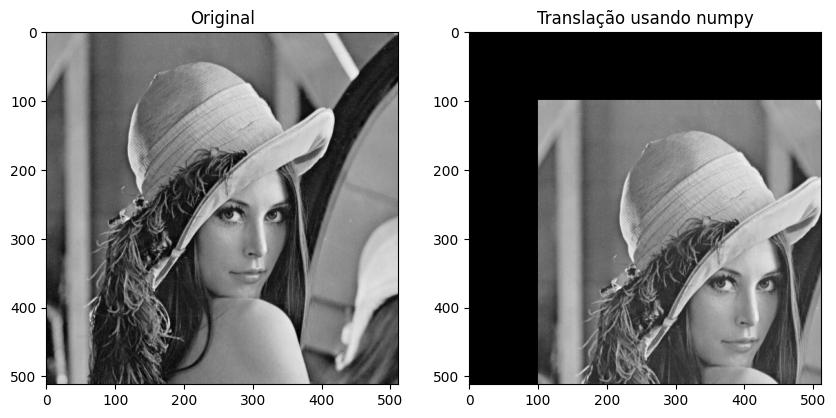

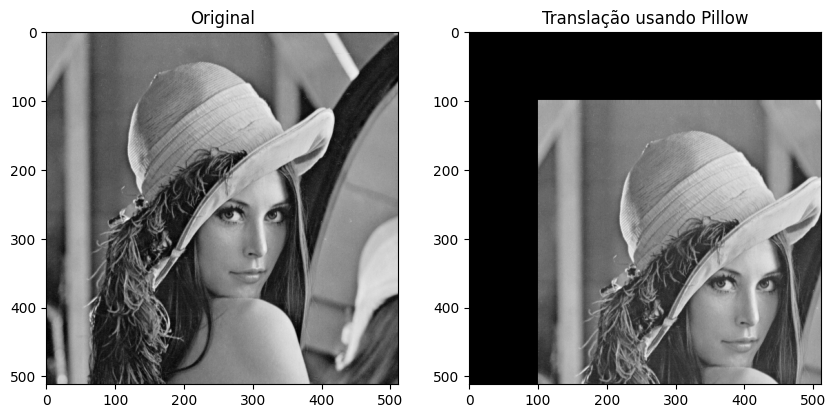

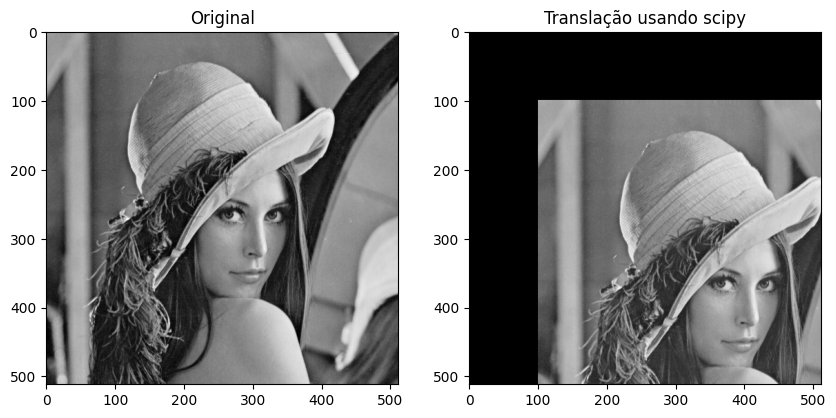

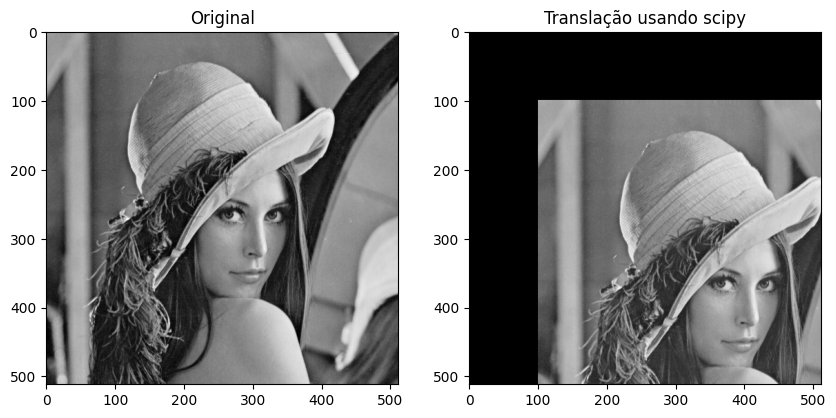

In [ ]:
for index in range(len(images)):
  imagem = images[index]
  x = 100
  y = 100
  translacao_numpy(imagem, x, y)
  translacao_pillow(imagem, x, y)
  translacao_opencv(imagem, x, y)
  translacao_scipy(imagem, x, y)